In [2]:
%cd "~/lab/NB10422645"
from src.surrogate.sampling.util import plotly3Dsurf, plotly3Dtrisurf, plotly3Dsurface_F2D_7by3
from src.surrogate.sampling.uninformed import grid_sample_domain 
from src.surrogate.sampling.uninformed import random_uniform_sample_domain
from src.surrogate.sampling.uninformed import halton_sample_domain 
from src.surrogate.test import TestFunctionSet2DInputSpace
F2D = TestFunctionSet2DInputSpace()
import matplotlib.pyplot as plt
import numpy as np

/home/ggarrett/lab/NB10422645


# Non-uniform sampling

We can transform a uniform sampling into a desired non-uniform joint distribution sampling set through mehods which mimick the JCDF. 
- Acceptance/rejection
- Weighted method
- Marginal cumulative distribution function (CDF)

## Target function

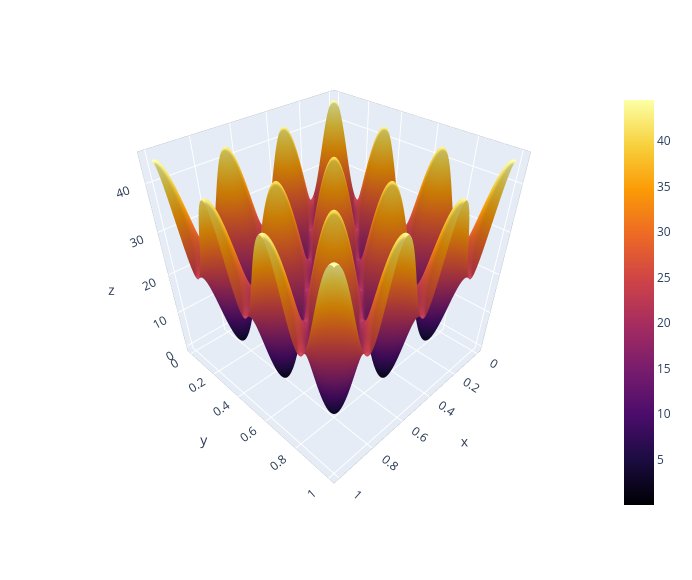

In [16]:
F2D = TestFunctionSet2DInputSpace()
F_ = F2D[0]
F_._bounds = F_.bounds * 0.3
N = 200
f1_grid = grid_sample_domain(F_.norm_bounds,N, flatten=False)
x, y = f1_grid[0], f1_grid[1]
eva_f = F_(x,y)
plotly3Dsurf(x, y, eva_f, save=False)

## Importance sampling

**What do we want to sample?** 

- Maximum
- Minimum
- Threshold
- Error in surrogate $\epsilon_s = |f(x)-\hat{f}(x)|$



### Maximums

Leave function as is.

### Minimums

Formulate the target function (surrogate in this case) as:
- $f_{target}=max(\hat{f})-\hat{f}(x)$

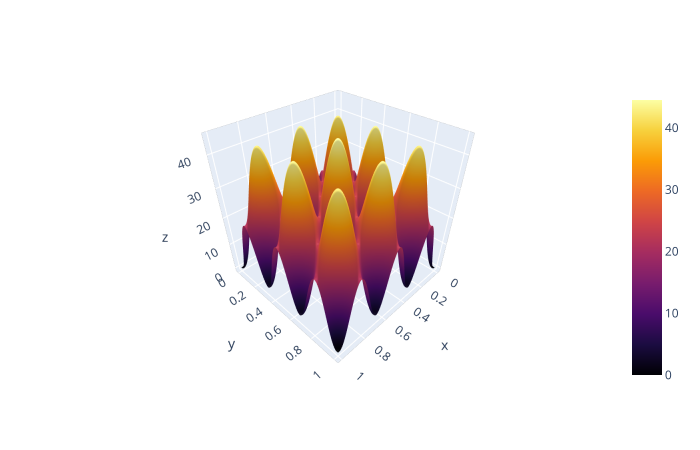

In [4]:
plotly3Dsurf(x, y, np.max(eva_f)-eva_f, save=False, renderer='svg')
minim_trans = lambda f: np.max(f) - f


### Threshold

- $f_{aux} = |\hat{f}(x)-C|$
- $f_{target} = max(f_{aux}) - f_{aux}$

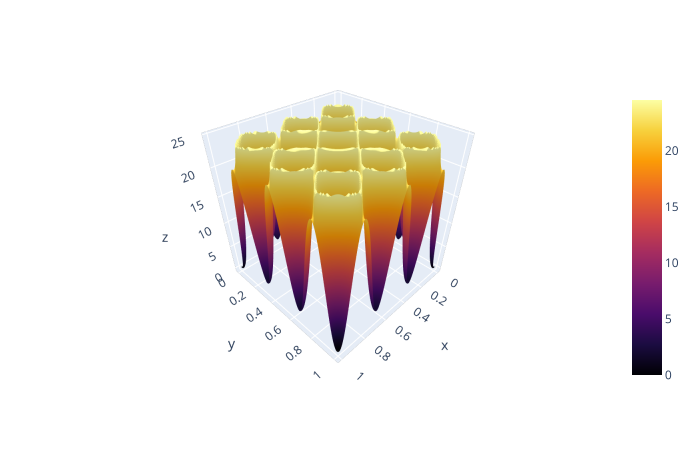

In [5]:
f_aux = np.abs(eva_f - 20)
plotly3Dsurf(x, y, np.max(f_aux)-f_aux, save=False, renderer='svg')
level_trans = lambda f, r: np.max(np.abs(f - r)) - np.abs(f - r)


## Make Marginal CDF

In [6]:
from scipy.interpolate import interp1d

# FUNCTION TO CALCULATE MARGINAL CDF.
def marginal_cdf(f_pdf, axis):
    f_pdf = f_pdf - np.min(f_pdf)
    f_pdf=f_pdf**3
    axes = np.arange(0,len(f_pdf.shape))
    aux = np.sum(f_pdf, axis=axes[axes!=axis][0])
    aux = np.concatenate(([0], np.cumsum(aux)))
    return aux / np.max(aux)

def marginal_cdf2(f, x):
    _x_sorted = x[np.argsort(x)]
    _f_sorted = f[np.argsort(x)]
    aux = np.cumsum(_f_sorted)
    _X = np.concatenate(([0],_x_sorted))
    aux = np.concatenate(([0],aux))
    _CDF = aux / np.max(aux)
    return _X, _CDF

def F_inverse_function(f, x):
    _X, _CDF = marginal_cdf2(f,x)
    return interp1d(_CDF, _X)

### Example: Maximum value MCDF

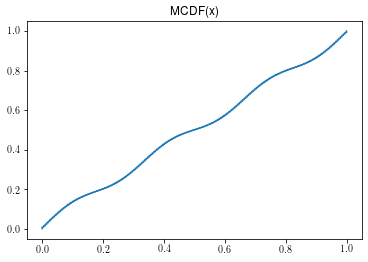

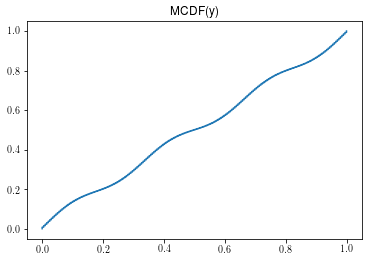

In [32]:
cdf_x =  marginal_cdf2(eva_f.flatten(), x.flatten())
cdf_y =  marginal_cdf2(eva_f.flatten(), y.flatten())


plt.plot(*cdf_x)
plt.title("MCDF(x)")
plt.show()
plt.plot(*cdf_y)
plt.title("MCDF(y)")
plt.show()

### Sampling Maximum

In [12]:
from scipy.interpolate import interp1d
import plotly.figure_factory as ff

# UNIFORM SAMPLING TO TRANSFORM USING JPDF.
sampling = grid_sample_domain(F_.norm_bounds,1000,flatten=True)

fig = ff.create_2d_density(
    F_inverse_function(eva_f, x)(sampling[:,0]),  
    F_inverse_function(eva_f, y)(sampling[:,1]),
    hist_color='rgb(255, 237, 222)', point_size=3
)

fig.show()


# import matplotlib.pyplot as plt
# plt.plot(x, y, 'o', xnew, f(xnew), '-', xnew, f2(xnew), '--')
# plt.legend(['data', 'linear', 'cubic'], loc='best')
# plt.show()

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 1 dimension(s) and the array at index 1 has 3 dimension(s)

### Sampling Minimum

In [11]:
# UNIFORM SAMPLING TO TRANSFORM USING JPDF.
sampling = grid_sample_domain(F_.norm_bounds,1000,flatten=True)

fig = ff.create_2d_density(
    F_inverse_function(minim_trans(eva_f).flatten(), x.flatten())(f2_grid[:,0]),  
    F_inverse_function(minim_trans(eva_f).flatten(), y.flatten())(f2_grid[:,1]),
    hist_color='rgb(255, 237, 222)', point_size=3
)

fig.show()

NameError: name 'f2_grid' is not defined

### Sampling Threshold

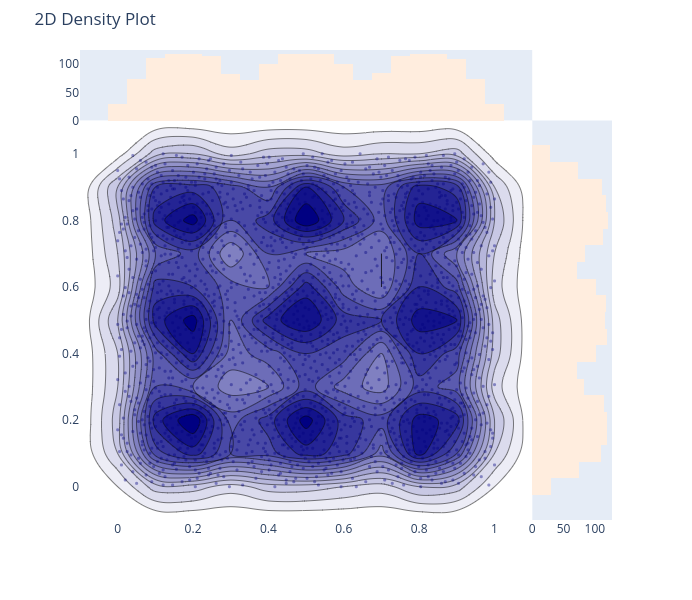

In [186]:
# UNIFORM SAMPLING TO TRANSFORM USING JPDF.
sampling = grid_sample_domain(F_.norm_bounds,1000,flatten=True)

fig = ff.create_2d_density(
    F_inverse_function(level_trans(eva_f, 15).flatten(), x.flatten())(f2_grid[:,0]),  
    F_inverse_function(level_trans(eva_f, 15).flatten(), y.flatten())(f2_grid[:,1]),
    hist_color='rgb(255, 237, 222)', point_size=3
)

fig.show()

### Sampling Surrogate Error

**Original Function**

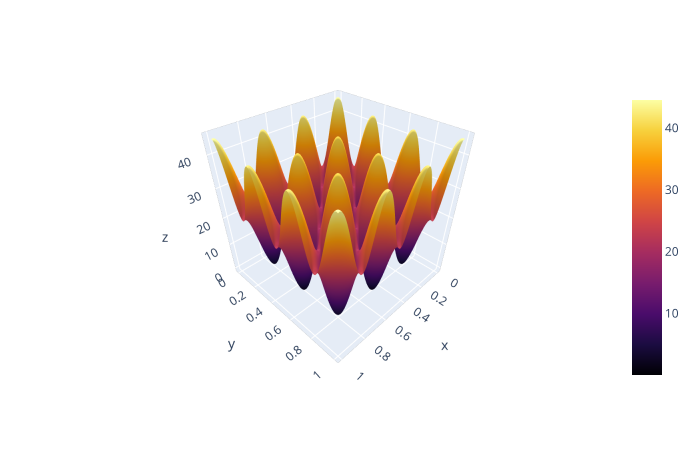

In [138]:
plotly3Dsurf(x, y, eva_f, save=False, renderer='svg')

**Train a SVM regression model**

(2500,)


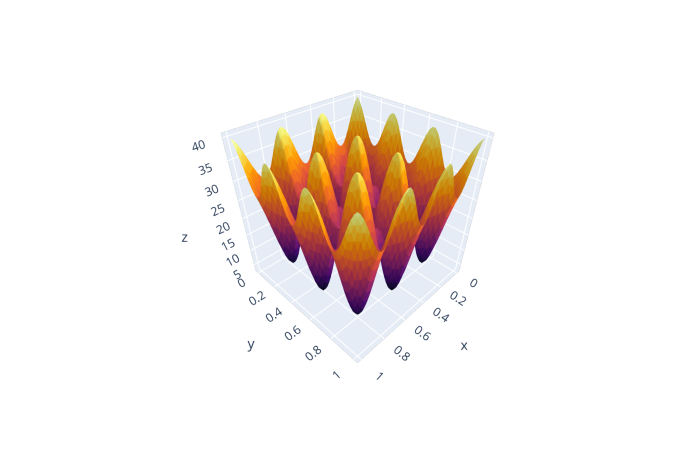

In [14]:
from sklearn import svm

Ns_learn = 50
X = grid_sample_domain(F_.norm_bounds,Ns_learn, flatten=True)

y = F_(X[0], X[1])

X_g = grid_sample_domain(F_.norm_bounds,Ns_learn, flatten=False)
Y_g = F_(X_g[0], X_g[1])

clf = svm.SVR(gamma=30)

print(y.shape)
clf.fit(X.T, y) 
y_pred = clf.predict(X.T)

plotly3Dtrisurf(X[0], X[1], clf.predict(X.T), save=False, renderer='svg')

**Calculate Surrogate Error**

In [15]:
from src.surrogate.sampling.uninformed import random_uniform_sample_domain

X_v = random_uniform_sample_domain(F_.norm_bounds,20)
Y_v = F_(X_v[0], X_v[1])

# plotly3Dtrisurf(X_v[0], X_v[1], np.abs(Y_v - clf.predict(X_v.T)), save=False)


error_s = np.abs(Y_v - clf.predict(X_v.T))

# UNIFORM SAMPLING TO TRANSFORM USING JPDF.
sampling = grid_sample_domain(F_.norm_bounds,10,flatten=True)

fig = ff.create_2d_density(
    F_inverse_function(error_s, X_v[0])(X_v[0]),  
    F_inverse_function(error_s, X_v[1])(X_v[1]),
    hist_color='rgb(255, 237, 222)', point_size=3
)

fig.show()

ValueError: X.shape[1] = 20 should be equal to 2, the number of features at training time